# Early Earthquake Detection System using XGBClassifier and 1D CNN

## Prerequisite (Installing and Importing Packages)

In [ ]:
!pip install -U -q segmentation-models
!pip install -q tensorflow==2.1
!pip install -q keras==2.3.1
!pip install -q tensorflow-estimator==2.1.

In [1]:
## Importing packages

import pandas as pd
import h5py
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, mean_squared_error
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.callbacks import EarlyStopping
keras = tf.keras

from datetime import datetime

## Importing The Dataset

In [2]:
df_csv = pd.read_csv('Dataset/merged.csv')
df_hdf5 = h5py.File('Dataset/merge.hdf5', 'r')

c:\Users\ASUS\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (7,11,13,14,15,18,19,20,21,22,24,25,26,30,31) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## Explanatory Data Analysis

In [ ]:
## Library for EDA
from skimage import io, color, filters
from skimage.transform import resize, rotate
from skimage.color import rgb2gray

import cartopy
from cartopy import config
import cartopy.crs as ccrs

plt.style.use('ggplot')

In [63]:
## Check the dataset with p and s wave arrival time being picked manually
df_csv_manual = df_csv[(df_csv.p_status == 'manual') & (df_csv.s_status == 'manual')]
df_csv_manual.head()

,network_code,receiver_code,receiver_type,receiver_latitude,receiver_longitude,receiver_elevation_m,p_arrival_sample,p_status,p_weight,p_travel_sec,...,source_magnitude_author,source_mechanism_strike_dip_rake,source_distance_deg,source_distance_km,back_azimuth_deg,snr_db,coda_end_sample,trace_start_time,trace_category,trace_name
235426,TA,109C,BH,32.8889,-117.1051,150.0,700.0,manual,0.5,17.080000,...,None,None,0.92,102.09,159.3,[56.79999924 55.40000153 47.40000153],[[2896.]],2006-07-23 15:59:00.960000,earthquake_local,109C.TA_20060723155859_EV
235427,TA,109C,BH,32.8889,-117.1051,150.0,600.0,manual,0.5,16.879999,...,None,None,0.91,101.34,281.7,[65. 65.5 61.40000153],[[5508.]],2006-11-03 15:56:53.610000,earthquake_local,109C.TA_20061103155652_EV
235428,TA,109C,BH,32.8889,-117.1051,150.0,500.0,manual,0.5,17.260000,...,None,None,0.92,101.87,280.5,[37.20000076 42. 38.59999847],[[3114.]],2006-11-03 16:12:24.700000,earthquake_local,109C.TA_20061103161223_EV
235429,TA,109C,BH,32.8889,-117.1051,150.0,900.0,manual,0.5,17.280001,...,None,None,0.93,103.26,281.6,[54.09999847 54.90000153 45.5 ],[[3152.]],2006-11-14 13:32:22.540000,earthquake_local,109C.TA_20061114133221_EV
235430,TA,109C,BH,32.8889,-117.1051,150.0,700.0,manual,0.5,18.139999,...,None,None,0.92,102.48,4.7,[58.20000076 56.20000076 53.79999924],[[3134.]],2006-11-27 10:46:41.060000,earthquake_local,109C.TA_20061127104640_EV


### 1. Overview of first 5 recorded seismic waves, from all three channels

The figure plot for traces109C.TA_20060723155859_EV


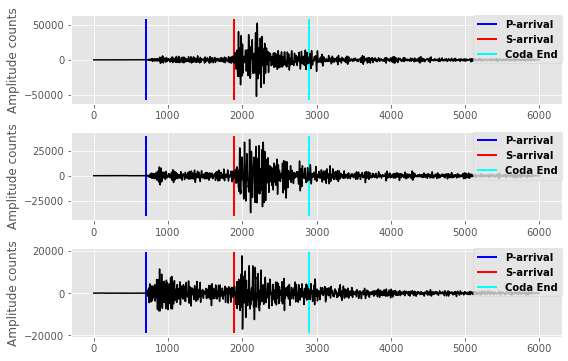

The figure plot for traces109C.TA_20061103155652_EV


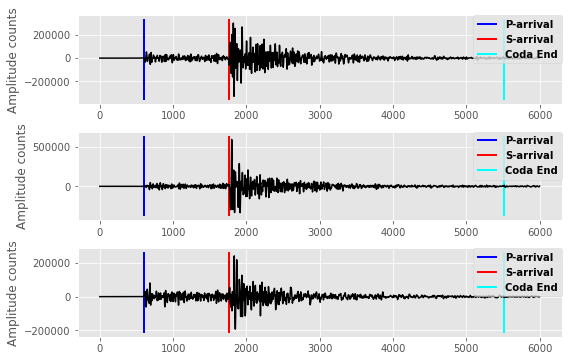

The figure plot for traces109C.TA_20061103161223_EV


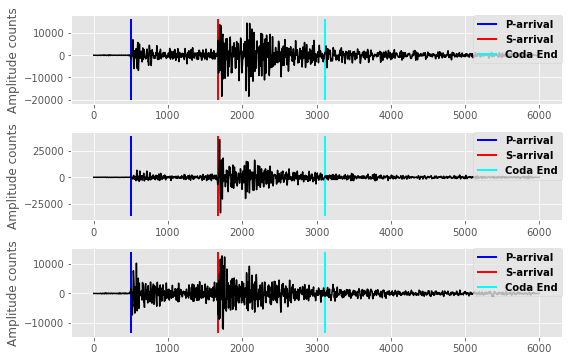

The figure plot for traces109C.TA_20061114133221_EV


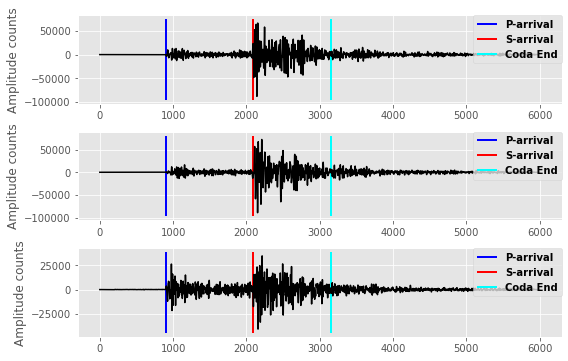

The figure plot for traces109C.TA_20061127104640_EV


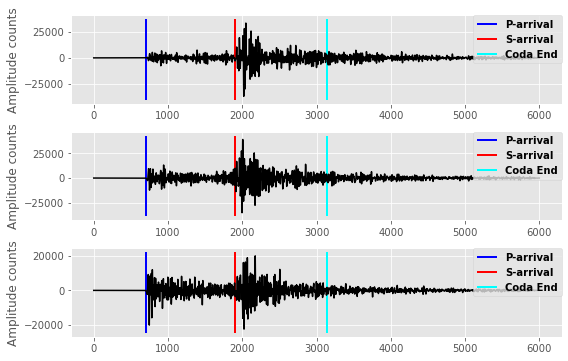

In [81]:
## Plot each waves of the first 5 rows of the dataset

traces_name = df_csv_manual.head()['trace_name'].to_list()
for i, name in enumerate(traces_name):
    dataset = df_hdf5.get('data/' + str(name))

    data = np.array(dataset)
    print("The figure plot for traces" + str(name))

    fig = plt.figure()

    ax = fig.add_subplot(311)         
    plt.plot(data[:,0], 'k')
    plt.rcParams["figure.figsize"] = (8, 5)
    legend_properties = {'weight':'bold'}    
    plt.tight_layout()
    ymin, ymax = ax.get_ylim()
    pl = plt.vlines(dataset.attrs['p_arrival_sample'], ymin, ymax, color='b', linewidth=2, label='P-arrival')
    sl = plt.vlines(dataset.attrs['s_arrival_sample'], ymin, ymax, color='r', linewidth=2, label='S-arrival')
    cl = plt.vlines(dataset.attrs['coda_end_sample'], ymin, ymax, color='aqua', linewidth=2, label='Coda End')
    plt.legend(handles=[pl, sl, cl], loc = 'upper right', borderaxespad=0., prop=legend_properties)        
    plt.ylabel('Amplitude counts', fontsize=12)

    ax = fig.add_subplot(312)         
    plt.plot(data[:,1], 'k')
    plt.rcParams["figure.figsize"] = (8, 5)
    legend_properties = {'weight':'bold'}    
    plt.tight_layout()
    ymin, ymax = ax.get_ylim()
    pl = plt.vlines(dataset.attrs['p_arrival_sample'], ymin, ymax, color='b', linewidth=2, label='P-arrival')
    sl = plt.vlines(dataset.attrs['s_arrival_sample'], ymin, ymax, color='r', linewidth=2, label='S-arrival')
    cl = plt.vlines(dataset.attrs['coda_end_sample'], ymin, ymax, color='aqua', linewidth=2, label='Coda End')
    plt.legend(handles=[pl, sl, cl], loc = 'upper right', borderaxespad=0., prop=legend_properties)        
    plt.ylabel('Amplitude counts', fontsize=12)

    ax = fig.add_subplot(313)         
    plt.plot(data[:,2], 'k')
    plt.rcParams["figure.figsize"] = (8,5)
    legend_properties = {'weight':'bold'}    
    plt.tight_layout()
    ymin, ymax = ax.get_ylim()
    pl = plt.vlines(dataset.attrs['p_arrival_sample'], ymin, ymax, color='b', linewidth=2, label='P-arrival')
    sl = plt.vlines(dataset.attrs['s_arrival_sample'], ymin, ymax, color='r', linewidth=2, label='S-arrival')
    cl = plt.vlines(dataset.attrs['coda_end_sample'], ymin, ymax, color='aqua', linewidth=2, label='Coda End')
    plt.legend(handles=[pl, sl, cl], loc = 'upper right', borderaxespad=0., prop=legend_properties)        
    plt.ylabel('Amplitude counts', fontsize=12) 

    plt.show() 

### 2. Example of both waveform and spectrogram plot of a seismic wave

In [ ]:
trace_name_earthquake = df_csv[df_csv['trace_category'] == 'earthquake_local']['trace_name'].tolist()
df_earthquake = df_csv[df_csv['trace_category'] == 'earthquake_local']
trace_name_noise = df_csv[df_csv['trace_category'] == 'noise']['trace_name'].tolist()

labels = df_csv['trace_category']
labels = labels.map(lambda x: 1 if x == 'earthquake_local' else 0)
labels = np.array(labels)

trace_name = df_csv['trace_name'].tolist()

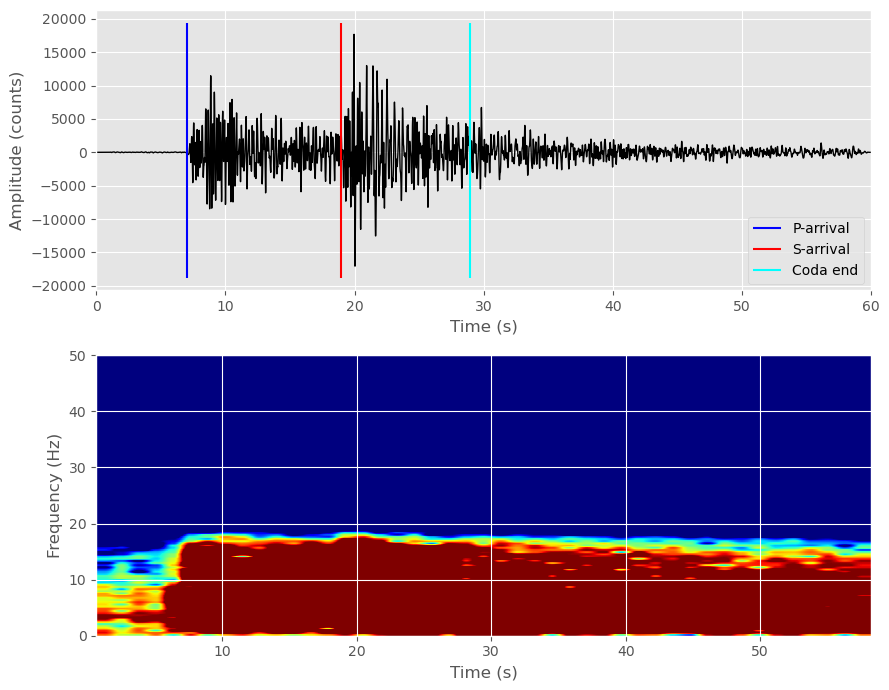

The p-wave for this waveform was picked by: manual
The s-wave for this waveform was picked by: manual


In [ ]:
dataset = df_hdf5.get('data/'+str(trace_name_earthquake[0])) # fetch one signal from the file
# waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel
data = np.array(dataset)

# plot
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(9,7))

ax1.plot(np.linspace(0,60,6000),data[:,2],color='k',linewidth=1) # plot waveform
ymin, ymax = ax1.get_ylim()
ax1.vlines(dataset.attrs['p_arrival_sample']/100, ymin, ymax, color='b',linewidth=1.5, label='P-arrival') # plot p-wave arrival time
ax1.vlines(dataset.attrs['s_arrival_sample']/100, ymin, ymax, color='r', linewidth=1.5, label='S-arrival') # plot s-wave arrival time
ax1.vlines(dataset.attrs['coda_end_sample']/100, ymin, ymax, color='cyan', linewidth=1.5, label='Coda end')
ax1.set_xlim([0,60])
ax1.legend(loc='lower right',fontsize=10)
ax1.set_ylabel('Amplitude (counts)')
ax1.set_xlabel('Time (s)')

ax2.specgram(data[:,2],Fs=100,NFFT=256,cmap='jet',vmin=-10,vmax=25); # plot spectrogram
ax2.set_ylabel('Frequency (Hz)')
ax2.set_xlabel('Time (s)')

plt.savefig('waveform_spectrogram_plot.png',dpi=500)
plt.tight_layout()
plt.show()

print('The p-wave for this waveform was picked by: ' + dataset.attrs['p_status'])
print('The s-wave for this waveform was picked by: ' + dataset.attrs['s_status'])

### 3. Geolocation plot of the distribution of recorded earthquake from the dataset

/opt/conda/lib/python3.7/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)
/opt/conda/lib/python3.7/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)
/opt/conda/lib/python3.7/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


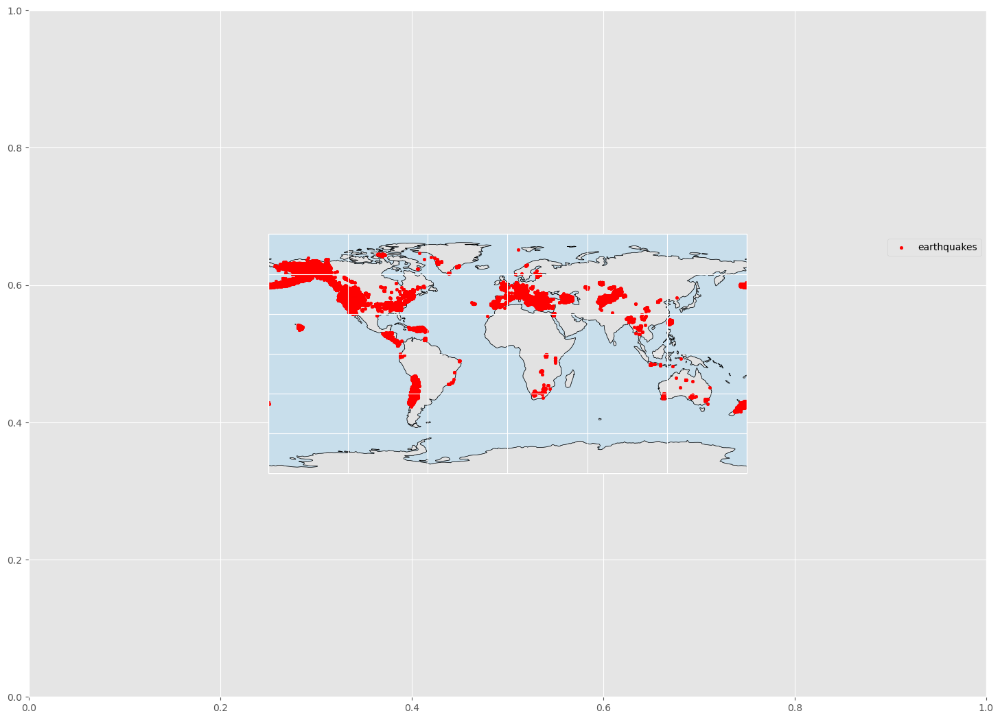

In [ ]:
## Plotting the earthquake distribution

lats = df_csv['source_latitude'] # get earthquake latitudes
lons = df_csv['source_longitude'] # get earthquake longitudes
sizes = df_csv['source_magnitude'] # get earthquake magnitudes to plot point sizes

fig, ax = plt.subplots(figsize=(18,13))
ax = plt.axes(projection=ccrs.PlateCarree()) # choose a map projection using Cartopy
ax.coastlines() # add coastlines to map
ax.add_feature(cartopy.feature.OCEAN,color='lightskyblue',alpha=0.3) # fill ocean with color
ax.add_feature(cartopy.feature.LAND, facecolor='gainsboro',edgecolor='black',alpha=0.3) # fill land with color
ax.gridlines(color='white')
ax.scatter(lons,lats,c='red',s=10, marker='o', transform=ccrs.PlateCarree(),label='earthquakes') # add points represnting each earthquake location
ax.set_xlim([-360,360])
ax.set_ylim([-90,90])
ax.legend()
plt.savefig('earthquake_map.png',dpi=1000)
plt.show()

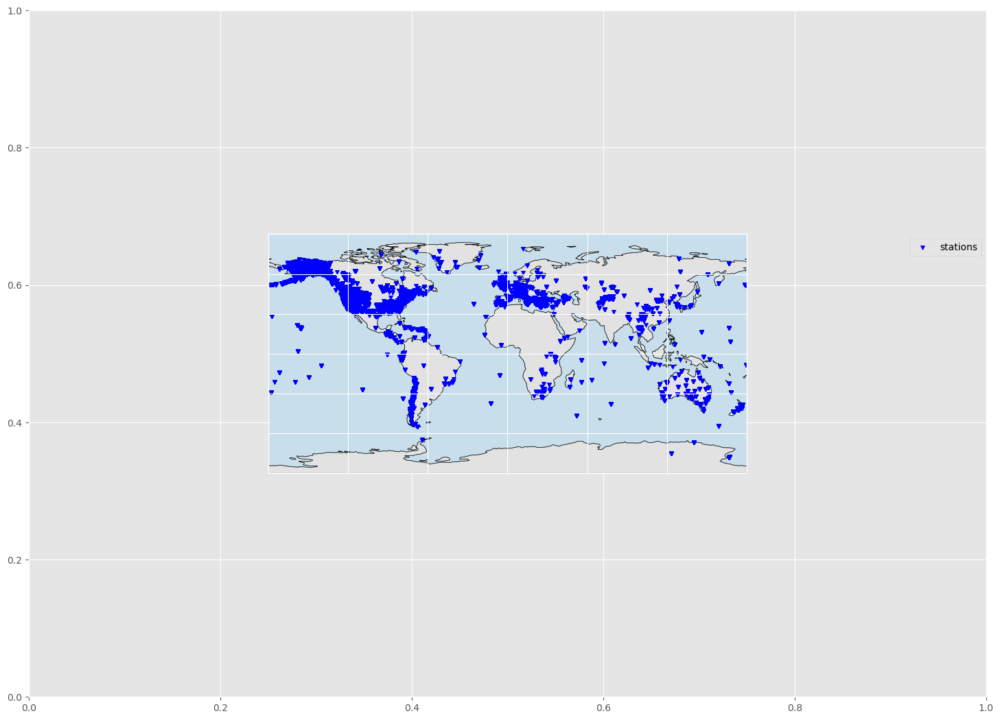

In [ ]:
## Plotting the recorded station used to record seismic waves

lats = df_csv['receiver_latitude'] # get seismic station latitudes
lons = df_csv['receiver_longitude'] # get seismic station longitudes

# plot
fig, ax = plt.subplots(figsize=(18,13))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.OCEAN,color='lightskyblue',alpha=0.3)
ax.add_feature(cartopy.feature.LAND, facecolor='gainsboro',edgecolor='black',alpha=0.3)
ax.gridlines(color='white')
ax.scatter(lons,lats,c='blue',marker='v',s=20,transform=ccrs.PlateCarree(),label='stations')
ax.set_xlim([-360,360])
ax.set_ylim([-90,90])
ax.legend()
plt.savefig('station_map.png',dpi=1000)
plt.show()

### 4. Distribution Plot of Earthquake Magnitudes in the dataset

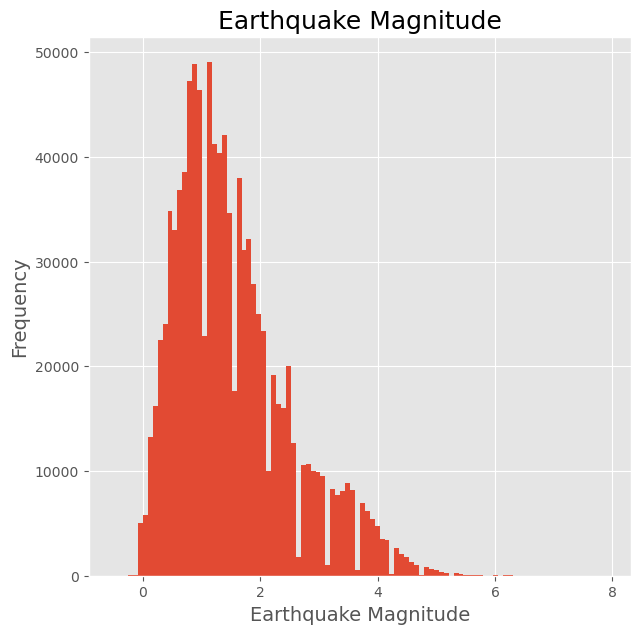

In [ ]:
# plot
plt.style.use('ggplot')
fig, (ax1) = plt.subplots(1,1,figsize=(7,7))
ax1.hist(df_csv['source_magnitude'],bins=100) # plot earthquake source magnitude
ax1.set_xlabel('Earthquake Magnitude',fontsize=14)
ax1.set_ylabel('Frequency',fontsize=14)
ax1.set_title('Earthquake Magnitude',fontsize=18)
plt.savefig('mags_eda.png',dpi=500)
#plt.tight_layout()
plt.show()

## Image Dataset Creation, for Both Waveform Image and Spectogram Image
This step is crucial since the CNN model we will be using needs a 2D-shaped array (image) as its input, so the recorded seismic waves need to be converted into a graphical representation first

In [4]:
## Initializing the number of data to be taken and the interval of the sampling rate
data_start = 0
data_end = 50000
data_interval = 1000

In [5]:
## Creating a list
eqlist = df_csv['trace_name'].to_list()
eqlist = np.random.choice(eqlist, data_end, replace = False)

In [6]:
starts = list(np.linspace(data_start, data_end - data_interval, int((data_end - data_start) / data_interval)))
ends = list(np.linspace(data_interval, data_end, int((data_end - data_start) / data_interval)))
set = str(df_csv)

### Defining functions to convert the signal into both waveform and spectogram images

In [7]:
## Function to create waveform image

def make_images_waveforms(i):
    # retrieving selected waveforms from the hdf5 file:
    try:
        dataset = df_hdf5.get('data/'+str(traces[i]))
        # waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel
        data = np.array(dataset)
        print('working on ' + set + ' waveform ' +str(traces[i]) + ' chunk '+str(count) + ' number ' +str(i))
        
        fig, ax = plt.subplots(figsize=(3,2))
        ax.plot(np.linspace(0,60,6000),data[:,2],color='k',linewidth=1)
        ax.set_xlim([0,60])
        ax.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
                    hspace = 0, wspace = 0)
        plt.margins(0,0)
        plt.savefig('Image/waveforms/'+traces[i]+'.png',bbox_inches='tight',dpi=50)
        plt.close()
        
    except:
        print('String index out of range')

In [8]:
## Function to create spectogram image

def make_images_spectogram(i):
    # retrieving selected waveforms from the hdf5 file:
    try:
        dataset = df_hdf5.get('data/'+str(traces[i]))
        # waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel
        data = np.array(dataset)
        print('working on ' + set + ' waveform ' +str(traces[i]) + ' chunk '+str(count) + ' number ' +str(i))
        
        fig, ax = plt.subplots(figsize=(3,2))
        ax.specgram(data[:,2],Fs=100,NFFT=256,cmap='gray',vmin=-10,vmax=25);
        ax.set_xlim([0,60])
        ax.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
                    hspace = 0, wspace = 0)
        plt.margins(0,0)
        plt.savefig('Image/spectogram/'+traces[i]+'.png',bbox_inches='tight',transparent = True,pad_inches=0,dpi=50)
        plt.close()
        
    except:
        print('String index out of range')

### Code to run the image creation process

#### Waveform Image (used for: P-wave and S-wave arrival time prediction)

In [10]:
## Code is commented to prevent from accidental run (this code doesn't need to be run if you already have the image!)

# count = 0
# for n in range(46, 50):
#     traces = eqlist[int(starts[n]):int(ends[n])]
#     count += 1

#     # create images for selected data (runs in parallel using joblib)
#     for i in range(0, len(traces)):
#         make_images_waveforms(i)

working on         network_code receiver_code receiver_type  receiver_latitude  \
0                 TA          109C            HH            32.8889   
1                 TA          109C            HH            32.8889   
2                 TA          109C            HH            32.8889   
3                 TA          109C            HH            32.8889   
4                 TA          109C            HH            32.8889   
...              ...           ...           ...                ...   
1265652           WY           YHL            HH            44.8509   
1265653           WY           YHL            HH            44.8509   
1265654           WY           YHL            HH            44.8509   
1265655           WY           YHL            HH            44.8509   
1265656           WY           YHL            HH            44.8509   

         receiver_longitude  receiver_elevation_m  p_arrival_sample p_status  \
0                 -117.1051                 150.0       

We also convert some signal with big magnitude for better generalization (since earthquake with magnitude >= 5.0 doesn't really occur quite often)

In [13]:
df_csv_sampled = df_csv[df_csv.source_magnitude >= 5]
ev_list = df_csv_sampled['trace_name'].to_list()
len(ev_list)

In [25]:
## special function just for the >=5 magnitude earthquake

def make_images_waveforms(i, traces):
    # retrieving selected waveforms from the hdf5 file:
    try:
        dataset = df_hdf5.get('data/'+str(traces[i]))
        # waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel
        data = np.array(dataset)
        print('working on ' + set + ' waveform ' +str(traces[i]) + ' chunk '+str(i) + ' number ' +str(i))
        
        fig, ax = plt.subplots(figsize=(3,2))
        ax.plot(np.linspace(0,60,6000),data[:,2],color='k',linewidth=1)
        ax.set_xlim([0,60])
        ax.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
                    hspace = 0, wspace = 0)
        plt.margins(0,0)
        plt.savefig('Image/waveforms/'+traces[i]+'.png',bbox_inches='tight',dpi=50)
        plt.close()
        
    except:
        print('String index out of range')

In [ ]:
## Code is commented to prevent from accidental run (this code doesn't need to be run if you already have the image!)

# for i in range(500, len(ev_list)):
#     make_images_waveforms(i, ev_list)

#### Spectogram Image (used for: earthquake classification, and magnitude estimation)

In [ ]:
## Code is commented to prevent from accidental run (this code doesn't need to be run if you already have the image!)

# count = 0
# for n in range(45, 50):
#     traces = eqlist[int(starts[n]):int(ends[n])]
#     count += 1

#     # create images for selected data (runs in parallel using joblib)
#     for i in range(0, len(traces)):
#         make_images_spectogram(i)

We also convert some signal with big magnitude for better generalization (since earthquake with magnitude >= 5.0 doesn't really occur quite often)

In [9]:
df_csv_sampled = df_csv[df_csv.source_magnitude >= 5]

In [10]:
ev_list = df_csv_sampled['trace_name'].to_list()

In [11]:
len(ev_list)

2035

In [12]:
## special function just for the >=5 magnitude earthquake

def make_images_spectogram(i, traces):
    # retrieving selected waveforms from the hdf5 file:
    try:
        dataset = df_hdf5.get('data/'+str(traces[i]))
        # waveforms, 3 channels: first row: E channel, second row: N channel, third row: Z channel
        data = np.array(dataset)
        print('working on ' + set + ' spectogram ' +str(traces[i]) + ' chunk '+str(i) + ' number ' +str(i))
        
        fig, ax = plt.subplots(figsize=(3,2))
        ax.specgram(data[:,2],Fs=100,NFFT=256,cmap='gray',vmin=-10,vmax=25);
        ax.set_xlim([0,60])
        ax.axis('off')
        plt.gca().set_axis_off()
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
                    hspace = 0, wspace = 0)
        plt.margins(0,0)
        plt.savefig('Image/spectogram/'+traces[i]+'.png',bbox_inches='tight',transparent = True,pad_inches=0,dpi=50)
        plt.close()
        
    except:
        print('String index out of range')

In [13]:
len(ev_list)

2035

In [14]:
## Code is commented to prevent from accidental run (this code doesn't need to be run if you already have the image!)

for i in range(0, len(ev_list)):
    make_images_spectogram(i, ev_list)

working on         network_code receiver_code receiver_type  receiver_latitude  \
0                 TA          109C            HH            32.8889   
1                 TA          109C            HH            32.8889   
2                 TA          109C            HH            32.8889   
3                 TA          109C            HH            32.8889   
4                 TA          109C            HH            32.8889   
...              ...           ...           ...                ...   
1265652           WY           YHL            HH            44.8509   
1265653           WY           YHL            HH            44.8509   
1265654           WY           YHL            HH            44.8509   
1265655           WY           YHL            HH            44.8509   
1265656           WY           YHL            HH            44.8509   

         receiver_longitude  receiver_elevation_m  p_arrival_sample p_status  \
0                 -117.1051                 150.0       

## Model Creation

### 1st Model: Classification CNN

#### Load the Dataset

In [ ]:
df_labels_earthquake = np.load('/kaggle/input/arkav-final/df_labels.npy')
df_labels_magnitude = np.load('/kaggle/input/temporary/magnitude_label.npy')

## load the saved numpy array
img_list_waveforms_vertical = np.load('/kaggle/input/arkav-final/img_waveforms_northsouth.npy')
img_list_waveforms_northsouth = np.load('/kaggle/input/arkav-final/img_waveforms_northsouth.npy')
img_list_waveforms_eastwest = np.load('/kaggle/input/arkav-final/img_waveforms_eastwest.npy')

In [ ]:
def train_test_split_func(X, y, test_size):
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42, test_size = test_size)
    
    print(f'The training images set is size: {X_train.shape}')
    print(f'The training labels set is size: {y_train.shape}')
    print(f'The testing images set is size: {X_test.shape}')
    print(f'The testing labels set is size: {y_test.shape}')

    ## Scaling the intensity of each image (normalization)
    X_train = X_train/255.0
    X_test = X_test/255.0

    ## Resizing each image, CNN needs a 4 dimensional tensor
    height = X_train.shape[1]
    width = X_train.shape[2]

    X_train = X_train.reshape(-1, height, width, 1)
    X_test = X_test.reshape(-1, height, width, 1)

    return X_train, X_test, y_train, y_test

In [ ]:
X_train_vertical, X_test_vertical, y_train_vertical, y_test_vertical = train_test_split_func(img_list_waveforms_vertical, df_labels_earthquake, 0.25)
X_train_eastwest, X_test_eastwest, y_train_eastwest, y_test_eastwest = train_test_split_func(img_list_waveforms_eastwest, df_labels_earthquake, 0.25)
X_train_northsouth, X_test_northsouth, y_train_northsouth, y_test_northsouth = train_test_split_func(img_list_waveforms_northsouth, df_labels_earthquake, 0.25)

The training images set is size: (53827, 110, 28)
The training labels set is size: (53827,)
The testing images set is size: (17943, 110, 28)
The testing labels set is size: (17943,)
The training images set is size: (53827, 110, 28)
The training labels set is size: (53827,)
The testing images set is size: (17943, 110, 28)
The testing labels set is size: (17943,)
The training images set is size: (53827, 110, 28)
The training labels set is size: (53827,)
The testing images set is size: (17943, 110, 28)
The testing labels set is size: (17943,)


In [ ]:
epochs = 50
print('Building the CNN model')
## Keywords:
## NS = north-south
## EW = east-west
## VE = vertical

inputEW = keras.Input(shape = (100, 25, 1), name = 'inputEW')
inputVE = keras.Input(shape = (100, 25, 1), name = 'inputVE')

x_EW = layers.Conv2D(32, kernel_size = (5, 5), activation = 'relu', padding = 'same')(inputEW)
x_VE = layers.Conv2D(32, kernel_size = (5, 5), activation = 'relu', padding = 'same')(inputVE)

x_EW = layers.MaxPool2D(2, 2)(x_EW)
x_VE = layers.MaxPool2D(2, 2)(x_VE)

x_EW = layers.Dropout(0.25)(x_EW)
x_VE = layers.Dropout(0.25)(x_VE)

x = layers.concatenate([x_EW, x_VE])
flatten = layers.Flatten()(x)

Dense_1 = layers.Dense(64, activation = 'relu')(flatten)
Dense_2 = layers.Dense(16, activation = 'relu')(Dense_1)

output = layers.Dense(2, activation = 'sigmoid', name = 'output')(Dense_2)

earthquake_model = keras.Model(
    inputs = [inputEW, inputVE],
    outputs = [output]
)

Building the CNN model


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate = 1e-6)
earthquake_model.compile(
    optimizer = optimizer, 
    loss = 'sparse_categorical_crossentropy', 
    metrics = ["accuracy"]
)

In [ ]:
history = earthquake_model.fit(
    {"inputEW": X_train_eastwest, "inputVE": X_train_vertical},
    {"output": y_train_eastwest},
    batch_size = 64,
    epochs = epochs,
    validation_split = 0.2
)

Epoch 1/50
674/674 [==============================] - 15s 11ms/step - loss: 0.4084 - accuracy: 0.8521 - val_loss: 0.2717 - val_accuracy: 0.9163
Epoch 2/50
674/674 [==============================] - 7s 11ms/step - loss: 0.2215 - accuracy: 0.9306 - val_loss: 0.1730 - val_accuracy: 0.9452
Epoch 3/50
674/674 [==============================] - 7s 10ms/step - loss: 0.1503 - accuracy: 0.9573 - val_loss: 0.1234 - val_accuracy: 0.9654
Epoch 4/50
674/674 [==============================] - 7s 11ms/step - loss: 0.1109 - accuracy: 0.9718 - val_loss: 0.0924 - val_accuracy: 0.9799
Epoch 5/50
674/674 [==============================] - 7s 10ms/step - loss: 0.0854 - accuracy: 0.9801 - val_loss: 0.0718 - val_accuracy: 0.9877
Epoch 6/50
674/674 [==============================] - 7s 10ms/step - loss: 0.0678 - accuracy: 0.9852 - val_loss: 0.0575 - val_accuracy: 0.9873
Epoch 7/50
674/674 [==============================] - 7s 11ms/step - loss: 0.0556 - accuracy: 0.9881 - val_loss: 0.0467 - val_accuracy: 0.993

In [ ]:
print(earthquake_model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputEW (InputLayer)           [(None, 100, 25, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 inputVE (InputLayer)           [(None, 100, 25, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 100, 25, 32)  832         ['inputEW[0][0]']                
                                                                                              

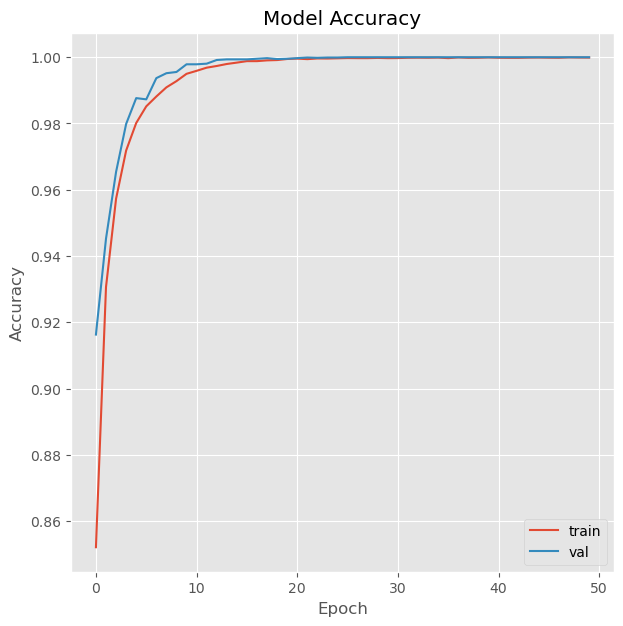

In [ ]:
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(history.history['accuracy'])
ax.plot(history.history['val_accuracy'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Accuracy')
ax.set_xlabel('Epoch')

ax.legend(['train','val'])
plt.savefig('earthquake_classification_modelaccuracy.png')
plt.show()

In [ ]:
## save the entire model
earthquake_model.save('earthquake_model_stacked_final.h5')

In [ ]:
## Accuracy on Test Set
test_loss, test_accuracy = earthquake_model.evaluate(
    {"inputEW": X_test_eastwest, "inputVE": X_test_vertical},
    {"output": y_test_eastwest},
    verbose = 1)
print("\nTest data, accuracy: {:5.2f}%".format(100*test_accuracy))

562/562 [==============================] - 2s 4ms/step - loss: 6.7954e-04 - accuracy: 0.9999

Test data, accuracy: 99.99%


In [ ]:
predicted_class = np.argmax(earthquake_model.predict(
    {
        "inputEW": X_test_eastwest, "inputVE": X_test_vertical
    }
), axis = -1)
predicted_probability = earthquake_model.predict(
    {
        "inputEW": X_test_eastwest, "inputVE": X_test_vertical
    }
)

562/562 [==============================] - 2s 4ms/step


In [ ]:
## Building the confusion matrix

conf_matrix = confusion_matrix(y_test_eastwest, predicted_class)
print(conf_matrix)

accuracy = accuracy_score(y_test_eastwest, predicted_class)
precision = precision_score(y_test_eastwest, predicted_class)
recall = recall_score(y_test_eastwest, predicted_class)

print(f'Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}')

[[ 5952     0]
 [    1 12007]]
Accuracy: 0.9999443207126949, Precision: 1.0, Recall: 0.9999167221852099


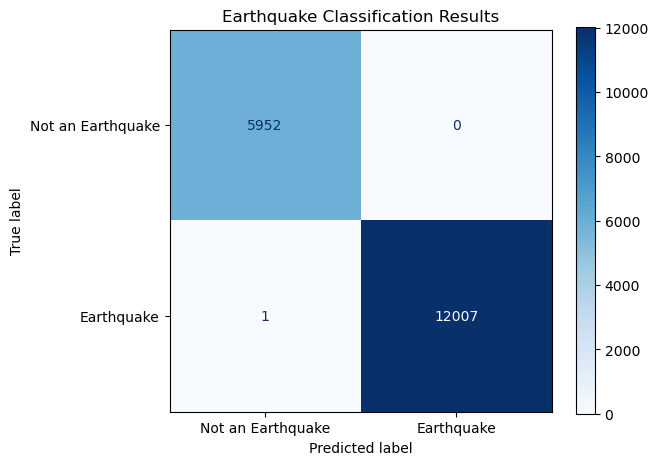

In [ ]:
## Plotting the confusion matrix

plt.style.use('default')
display = ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = ['Not an Earthquake', 'Earthquake'])
display.plot(cmap = 'Blues', values_format = '')
plt.title(f'Earthquake Classification Results')
plt.tight_layout()
plt.savefig('earthquake_classification_stacked_confmatrix_final.png')
plt.show()

### 2nd Model: Regression CNN (Earthquake Magnitude Estimation)

In [ ]:
print('Building the CNN Regression model')
## Keywords:
## NS = north-south
## EW = east-west
## VE = vertical

inputEW_2 = keras.Input(shape = (100, 25, 1), name = 'inputEW_2')
inputVE_2 = keras.Input(shape = (100, 25, 1), name = 'inputVE_2')

x_EW = layers.Conv2D(32, kernel_size = (5, 5), activation = 'relu', padding = 'same')(inputEW_2)
x_VE = layers.Conv2D(32, kernel_size = (5, 5), activation = 'relu', padding = 'same')(inputVE_2)

x_EW = layers.MaxPool2D(2, 2)(x_EW)
x_VE = layers.MaxPool2D(2, 2)(x_VE)

x_EW = layers.BatchNormalization()(x_EW)
x_VE = layers.BatchNormalization()(x_VE)

x_EW = layers.Dropout(0.50)(x_EW)
x_VE = layers.Dropout(0.50)(x_VE)

x = layers.concatenate([x_EW, x_VE])
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(64, activation = 'relu')(x)
x = layers.Dense(16, activation = 'relu')(x)

x_EW = layers.Dropout(0.2)(x_EW)
x_VE = layers.Dropout(0.2)(x_VE)

output = layers.Dense(1, name = 'output')(x)

magnitude_model = keras.Model(
    inputs = [inputEW_2, inputVE_2],
    outputs = [output]
)

Building the CNN Regression model


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate = 1e-6)
magnitude_model.compile(
    optimizer = 'adam', 
    loss = 'mse',
)

In [ ]:
history_2 = magnitude_model.fit(
    {"inputEW_2": X_train_eastwest_2, "inputVE_2": X_train_vertical_2},
    {"output": y_train_eastwest_2},
    batch_size = 64,
    epochs = 10,
    validation_split = 0.2
)

Epoch 1/10
449/449 [==============================] - 6s 11ms/step - loss: 1.8622 - val_loss: 1.4768
Epoch 2/10
449/449 [==============================] - 4s 10ms/step - loss: 1.1600 - val_loss: 1.3233
Epoch 3/10
449/449 [==============================] - 4s 10ms/step - loss: 1.0869 - val_loss: 1.2091
Epoch 4/10
449/449 [==============================] - 4s 10ms/step - loss: 1.0307 - val_loss: 1.3134
Epoch 5/10
449/449 [==============================] - 5s 11ms/step - loss: 1.0132 - val_loss: 1.3041
Epoch 6/10
449/449 [==============================] - 4s 10ms/step - loss: 0.9782 - val_loss: 0.8767
Epoch 7/10
449/449 [==============================] - 5s 10ms/step - loss: 0.9325 - val_loss: 0.8747
Epoch 8/10
449/449 [==============================] - 4s 10ms/step - loss: 0.9354 - val_loss: 0.8148
Epoch 9/10
449/449 [==============================] - 4s 10ms/step - loss: 0.8967 - val_loss: 1.0064
Epoch 10/10
449/449 [==============================] - 5s 10ms/step - loss: 0.8760 - val_lo

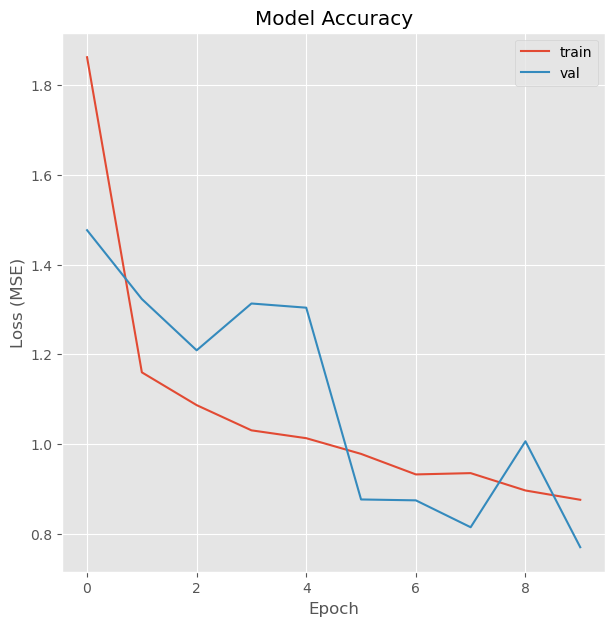

In [ ]:
## Plotting the fitting performance

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(7,7))
ax.plot(history_2.history['loss'])
ax.plot(history_2.history['val_loss'])
ax.set_title('Model Accuracy')
ax.set_ylabel('Loss (MSE)')
ax.set_xlabel('Epoch')

ax.legend(['train','val'])
plt.savefig('magnitude_estimation_modelaccuracy_2.png')
plt.show()

In [ ]:
predicted = magnitude_model.predict(
    {"inputEW_2": X_test_eastwest_2, "inputVE_2": X_test_vertical_2}
)

375/375 [==============================] - 1s 3ms/step


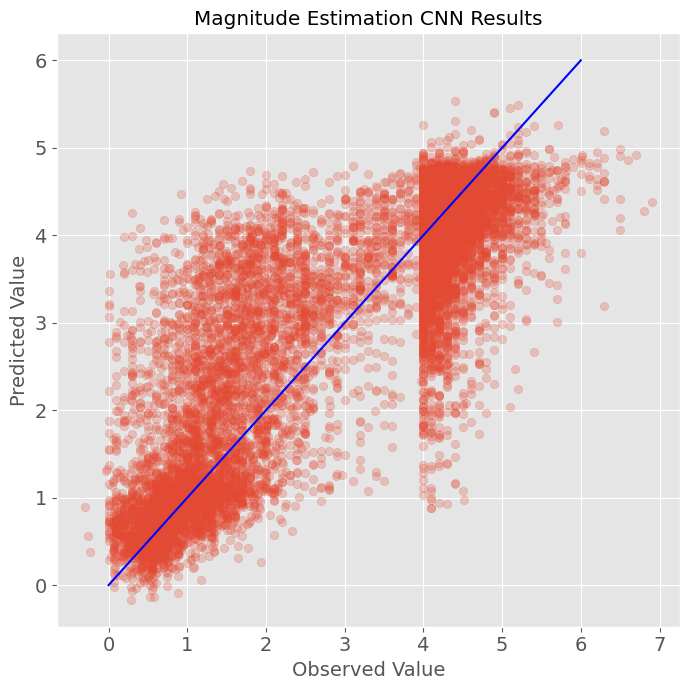

In [ ]:
## Plotting the confusion matrix

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize = (7, 7))
ax.scatter(y_test_eastwest_2, predicted, alpha = 0.25)
point1 = [0,0]
point2 = [6,6]

xvalues = [point1[0], point2[0]]
yvalues = [point1[1], point2[1]]

ax.plot(xvalues, yvalues, color = 'blue')
ax.set_ylabel('Predicted Value',fontsize = 14)
ax.set_xlabel('Observed Value',fontsize = 14)
ax.set_title(f'Magnitude Estimation CNN Results')

ax.tick_params(axis = 'x', labelsize = 14)
ax.tick_params(axis = 'y', labelsize = 14)
plt.tight_layout()
plt.savefig('magnitude_estimation_truevspred_3.png')
plt.show()

In [ ]:
## save the entire model
magnitude_model.save('magnitude_model_stacked_final.h5')

In [ ]:
test_loss = magnitude_model.evaluate(
    {"inputEW_2": X_test_eastwest_2, "inputVE_2": X_test_vertical_2},
    {"output": y_test_eastwest_2},
    verbose = 1)
print(f'Test data loss: {test_loss}')

375/375 [==============================] - 2s 4ms/step - loss: 0.7783
Test data loss: 0.7782512307167053


In [ ]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath=f'/kaggle/working/saved_models/epochs_{epochs}',
        save_freq='epoch')
]

In [26]:
## set the image directory. the image used for the regression CNN is the waveforms image. 
spec_dir = 'Image/spectogram/'

## creating an empty array used to store the filename
traces_array = []

for filename in os.listdir(spec_dir):
    if filename.endswith('.png'):
        traces_array.append(filename[0:-4])